In [1]:
import numpy as np
from scipy.interpolate import interp1d as interp
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
from src.thunderflask import thunderflask
from src.bacteria import strain
from src.ffgen import ffgen
from src.ffgen_isaac import ffgen
from src.redGen import reductionist
from src.codonTable import codonTable
from src.codonUtils import utils
from src.bacteria import strain
import pickle
from src.codonOptimizer import tableOptimizer
from queue import Queue as queue
from random import choice
from matplotlib.colors import LinearSegmentedColormap as LSC
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cProfile
import copy
import random
from scipy.signal import gaussian
from scipy.ndimage import convolve1d
import peakutils
from peakutils.plot import plot as pplot
%matplotlib inline

In [2]:
# import some data 
filename = 'res/manuscript_traces/3-6_FF Code 17AA_favg_traces_T=1000_N=100_b=1_l=2.pickle'
with open(filename, 'rb') as handle:
    df = pickle.load(handle)

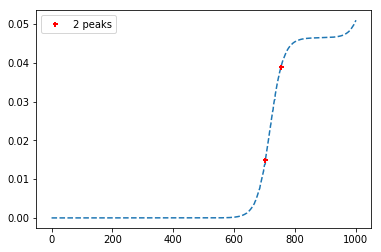

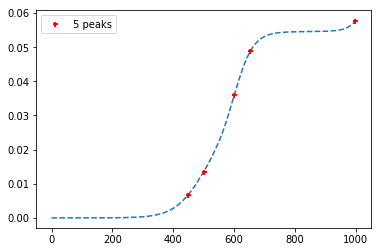

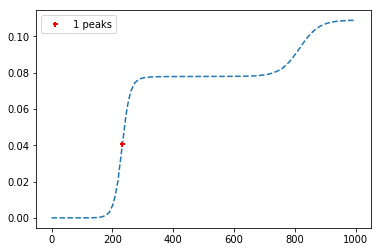

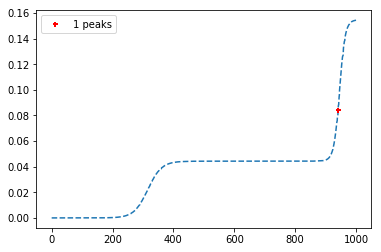

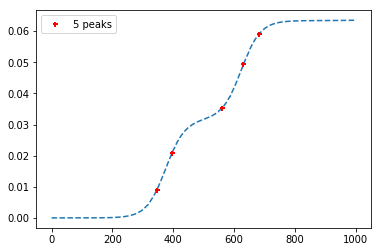

...

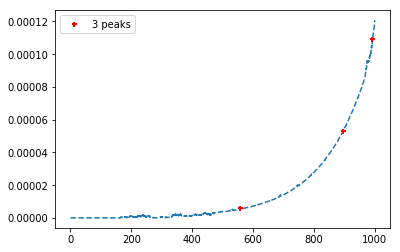

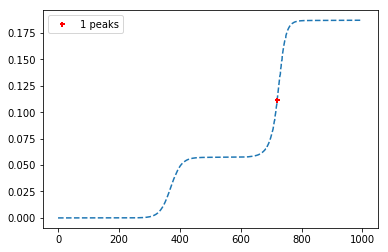

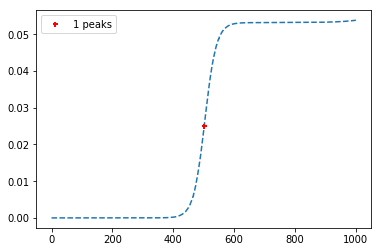

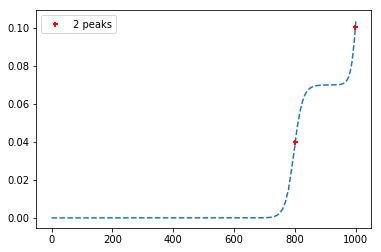

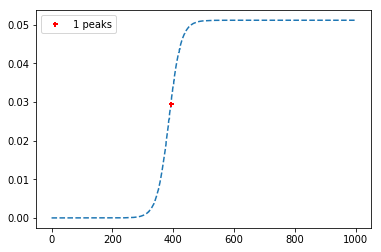

In [3]:
# loop over sims
sims = set(df['sim'].values)
t_lag = np.zeros(len(sims))
for i, sim in enumerate(sims):
    # extract data for this sim
    data = df[df['sim'] == sim]
    t = data['time'].values
    f = data['value'].values
    # smooth with gaussian filter
    gaussian_filter = gaussian(30, 10)
    filtered_signal = convolve1d(f, gaussian_filter/gaussian_filter.sum())
    # calculate first derivative  
    dt = np.diff(t)
    t_avg = (t[1:]+t[:-1])/2
    filt_grad = np.diff(filtered_signal)/dt
    # find peaks
    peak_ind = peakutils.indexes(filt_grad, thres=0.3, min_dist=int(50/dt.mean()))
    # get timestamp for this point
    t_lag[i] = t_avg[peak_ind[0]]
    pplot(t, f, peak_ind)
    plt.show()

In [4]:
t_ff17 = t_lag

In [5]:
# import some data 
filename = 'res/manuscript_traces/3-6_FF Code 18AA_favg_traces_T=1000_N=100_b=1_l=2.pickle'
with open(filename, 'rb') as handle:
    df = pickle.load(handle)

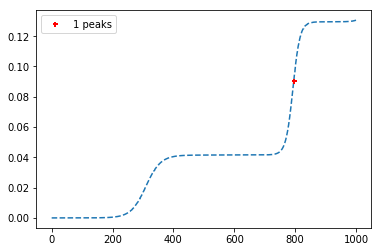

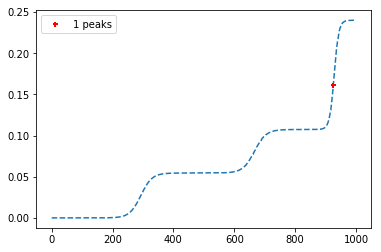

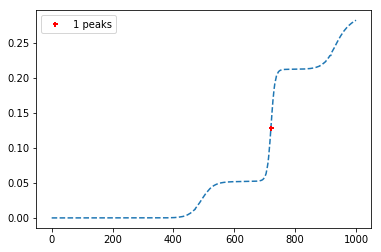

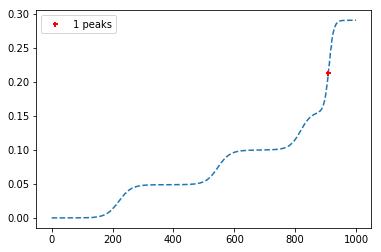

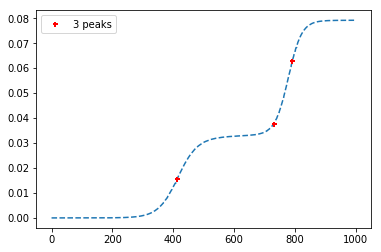

...

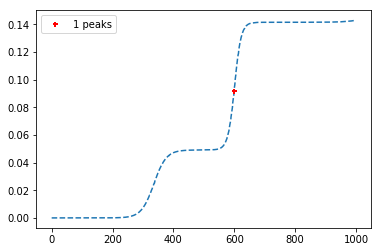

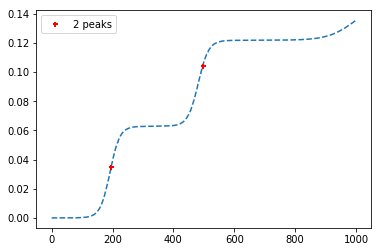

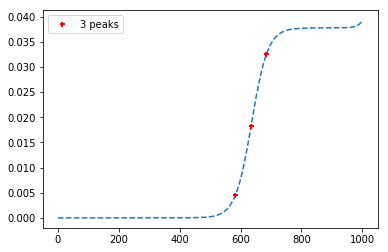

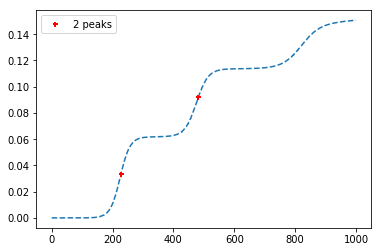

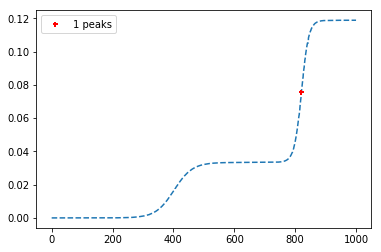

In [6]:
# loop over sims
sims = set(df['sim'].values)
t_lag = np.zeros(len(sims))
for i, sim in enumerate(sims):
    # extract data for this sim
    data = df[df['sim'] == sim]
    t = data['time'].values
    f = data['value'].values
    # smooth with gaussian filter
    gaussian_filter = gaussian(30, 10)
    filtered_signal = convolve1d(f, gaussian_filter/gaussian_filter.sum())
    # calculate first derivative  
    dt = np.diff(t)
    t_avg = (t[1:]+t[:-1])/2
    filt_grad = np.diff(filtered_signal)/dt
    # find peaks
    peak_ind = peakutils.indexes(filt_grad, thres=0.3, min_dist=int(50/dt.mean()))
    # get timestamp for this point
    t_lag[i] = t_avg[peak_ind[0]]
    pplot(t, f, peak_ind)
    plt.show()

In [7]:
t_ff18 = t_lag

In [8]:
# import some data 
filename = 'res/manuscript_traces/3-6_FF Code 19AA_favg_traces_T=1000_N=100_b=1_l=2.pickle'
with open(filename, 'rb') as handle:
    df = pickle.load(handle)

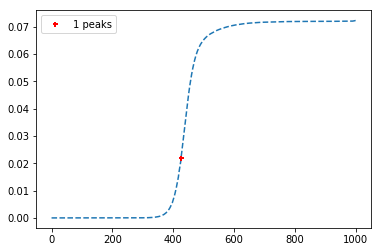

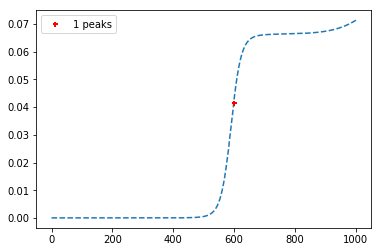

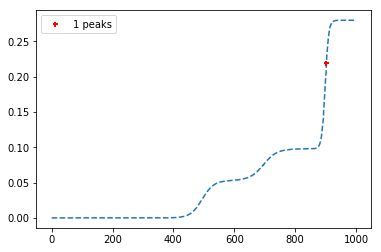

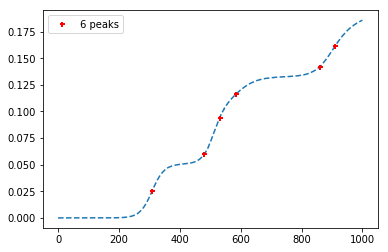

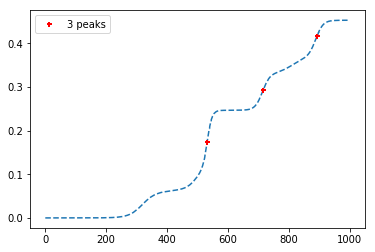

...

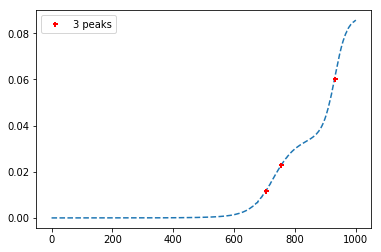

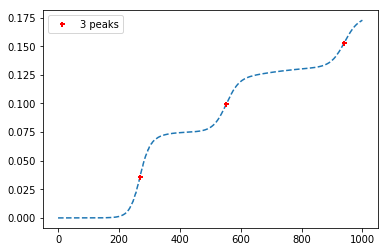

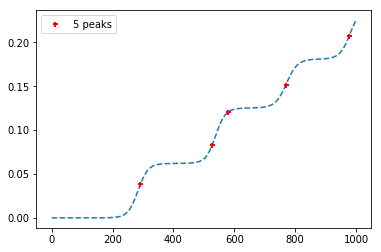

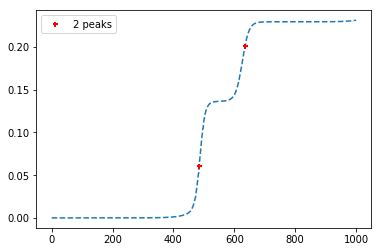

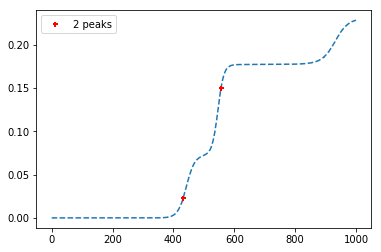

In [9]:
# loop over sims
sims = set(df['sim'].values)
t_lag = np.zeros(len(sims))
for i, sim in enumerate(sims):
    # extract data for this sim
    data = df[df['sim'] == sim]
    t = data['time'].values
    f = data['value'].values
    # smooth with gaussian filter
    gaussian_filter = gaussian(30, 10)
    filtered_signal = convolve1d(f, gaussian_filter/gaussian_filter.sum())
    # calculate first derivative  
    dt = np.diff(t)
    t_avg = (t[1:]+t[:-1])/2
    filt_grad = np.diff(filtered_signal)/dt
    # find peaks
    peak_ind = peakutils.indexes(filt_grad, thres=0.3, min_dist=int(50/dt.mean()))
    # get timestamp for this point
    t_lag[i] = t_avg[peak_ind[0]]
    pplot(t, f, peak_ind)
    plt.show()

In [10]:
t_ff19 = t_lag

In [11]:
# import some data 
filename = 'res/manuscript_traces/3-6_FF Code 20AA_favg_traces_T=1000_N=100_b=1_l=2.pickle'
with open(filename, 'rb') as handle:
    df = pickle.load(handle)

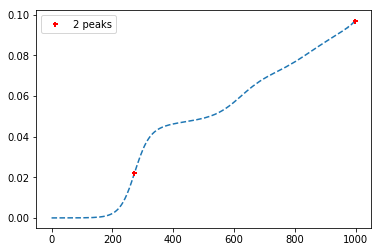

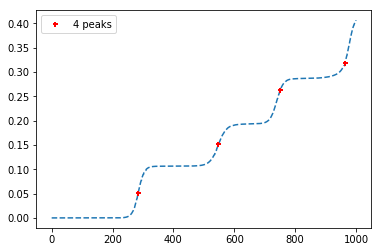

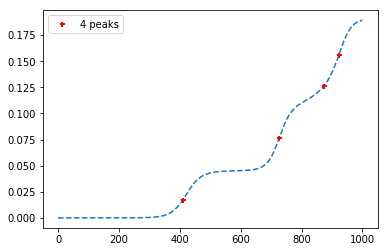

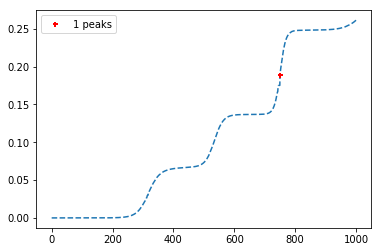

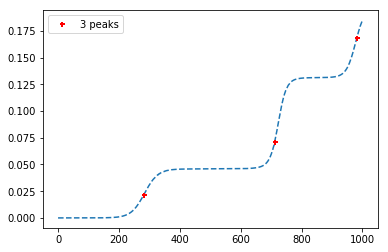

...

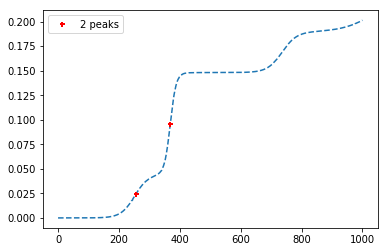

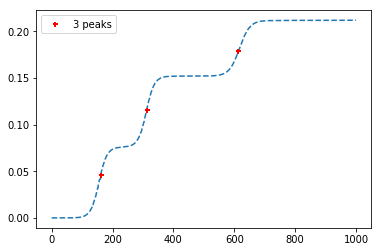

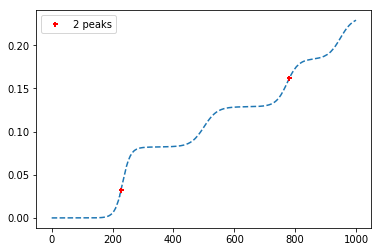

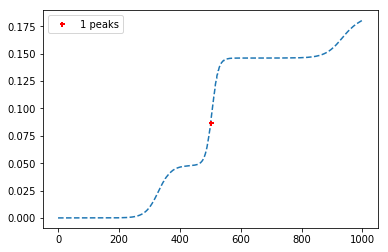

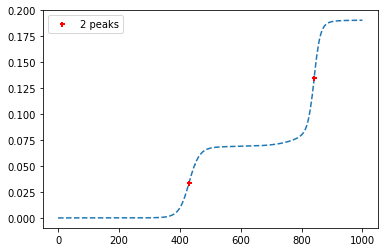

In [12]:
# loop over sims
sims = set(df['sim'].values)
t_lag = np.zeros(len(sims))
for i, sim in enumerate(sims):
    # extract data for this sim
    data = df[df['sim'] == sim]
    t = data['time'].values
    f = data['value'].values
    # smooth with gaussian filter
    gaussian_filter = gaussian(30, 10)
    filtered_signal = convolve1d(f, gaussian_filter/gaussian_filter.sum())
    # calculate first derivative  
    dt = np.diff(t)
    t_avg = (t[1:]+t[:-1])/2
    filt_grad = np.diff(filtered_signal)/dt
    # find peaks
    peak_ind = peakutils.indexes(filt_grad, thres=0.3, min_dist=int(50/dt.mean()))
    # get timestamp for this point
    t_lag[i] = t_avg[peak_ind[0]]
    pplot(t, f, peak_ind)
    plt.show()

In [13]:
t_ff20 = t_lag

In [14]:
data = [t_ff17, t_ff18, t_ff19, t_ff20]
codes = ['FF17', 'FF18', 'FF19','FF20']
dfs = []
for (series, code) in zip(data, codes):
    df = pd.DataFrame({
        't_lag' : series,
        'code' : [code for i in range(len(series))]
    })
    dfs.append(df)
all_data = pd.concat(dfs)

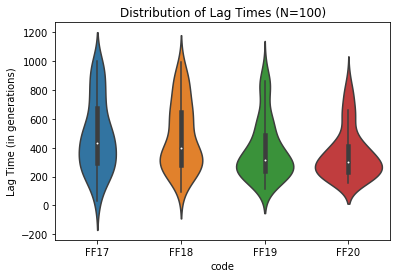

In [15]:
ax = sns.violinplot(x='code', y='t_lag', data=all_data)
plt.title('Distribution of Lag Times (N=100)')
plt.ylabel('Lag Time (in generations)')
plt.savefig('FF17-20.pdf')

In [16]:
# import some data 
filename = 'res/manuscript_traces/3-6_Reductionist Code 16AA_favg_traces_T=1000_N=100_b=1_l=2.pickle'
with open(filename, 'rb') as handle:
    df = pickle.load(handle)

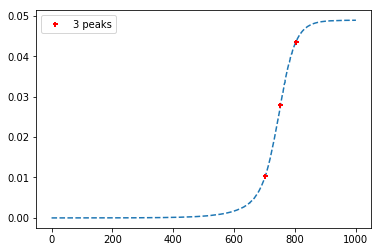

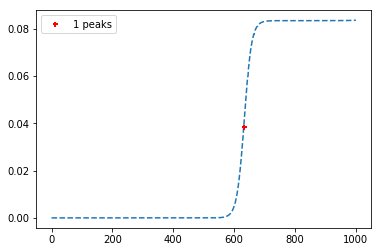

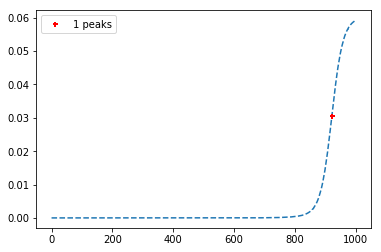

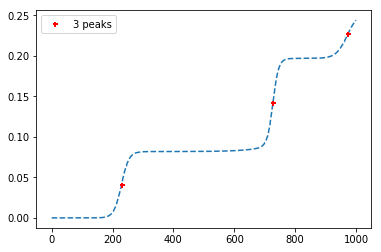

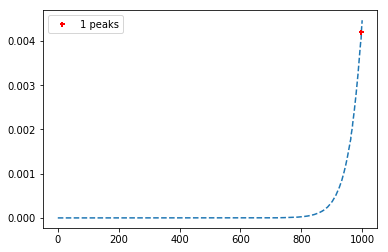

...

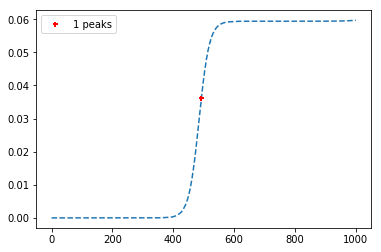

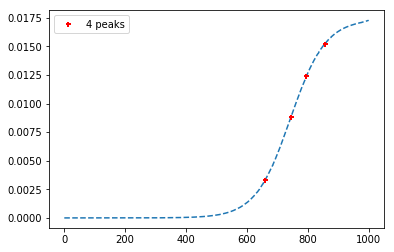

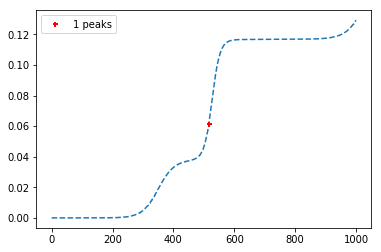

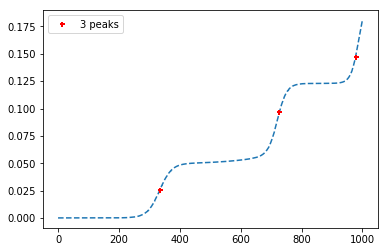

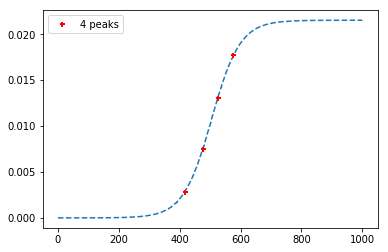

In [17]:
# loop over sims
sims = set(df['sim'].values)
t_lag = np.zeros(len(sims))
for i, sim in enumerate(sims):
    # extract data for this sim
    data = df[df['sim'] == sim]
    t = data['time'].values
    f = data['value'].values
    # smooth with gaussian filter
    gaussian_filter = gaussian(30, 10)
    filtered_signal = convolve1d(f, gaussian_filter/gaussian_filter.sum())
    # calculate first derivative  
    dt = np.diff(t)
    t_avg = (t[1:]+t[:-1])/2
    filt_grad = np.diff(filtered_signal)/dt
    # find peaks
    peak_ind = peakutils.indexes(filt_grad, thres=0.3, min_dist=int(50/dt.mean()))
    # get timestamp for this point
    t_lag[i] = t_avg[peak_ind[0]]
    pplot(t, f, peak_ind)
    plt.show()

In [18]:
t_r16 = t_lag

In [19]:
# import some data 
filename = 'res/manuscript_traces/3-6_Reductionist Code 17AA_favg_traces_T=1000_N=100_b=1_l=2.pickle'
with open(filename, 'rb') as handle:
    df = pickle.load(handle)

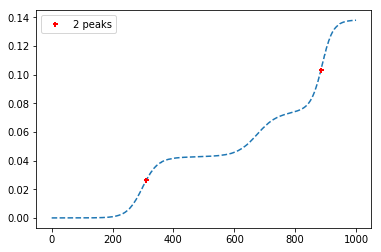

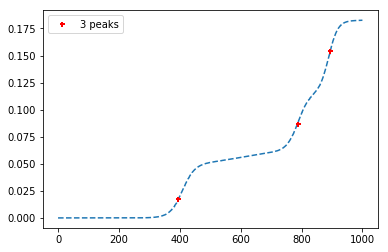

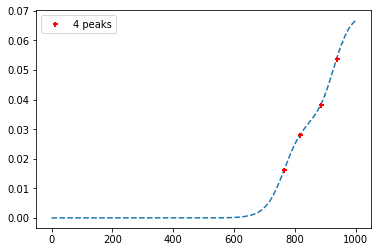

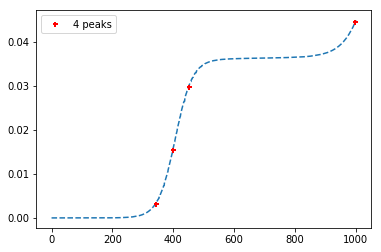

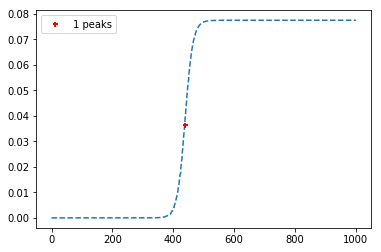

...

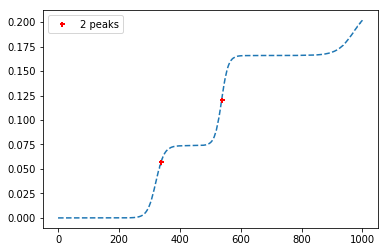

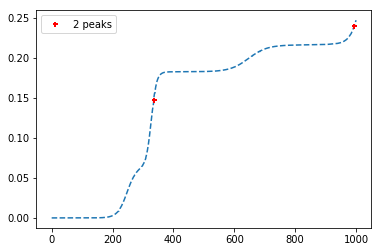

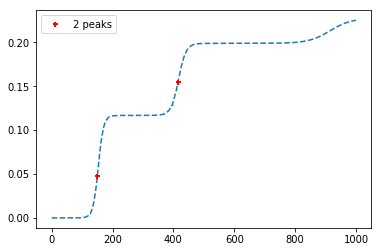

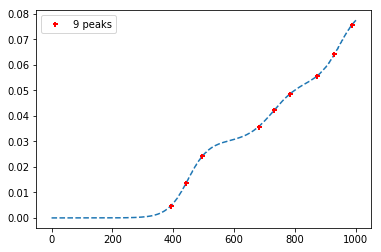

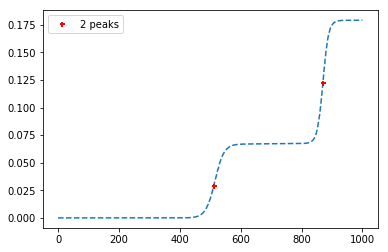

In [20]:
# loop over sims
sims = set(df['sim'].values)
t_lag = np.zeros(len(sims))
for i, sim in enumerate(sims):
    # extract data for this sim
    data = df[df['sim'] == sim]
    t = data['time'].values
    f = data['value'].values
    # smooth with gaussian filter
    gaussian_filter = gaussian(30, 10)
    filtered_signal = convolve1d(f, gaussian_filter/gaussian_filter.sum())
    # calculate first derivative  
    dt = np.diff(t)
    t_avg = (t[1:]+t[:-1])/2
    filt_grad = np.diff(filtered_signal)/dt
    # find peaks
    peak_ind = peakutils.indexes(filt_grad, thres=0.3, min_dist=int(50/dt.mean()))
    # get timestamp for this point
    t_lag[i] = t_avg[peak_ind[0]]
    pplot(t, f, peak_ind)
    plt.show()

In [21]:
t_r17 = t_lag

In [22]:
# import some data 
filename = 'res/manuscript_traces/3-6_Reductionist Code 18AA_favg_traces_T=1000_N=100_b=1_l=2.pickle'
with open(filename, 'rb') as handle:
    df = pickle.load(handle)

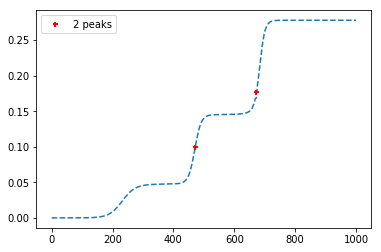

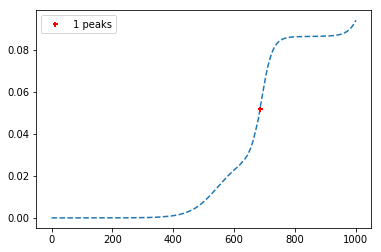

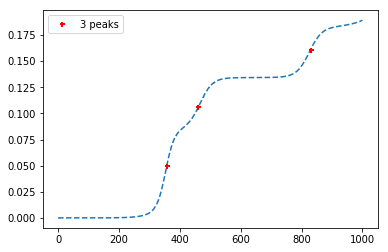

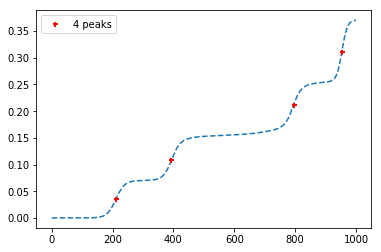

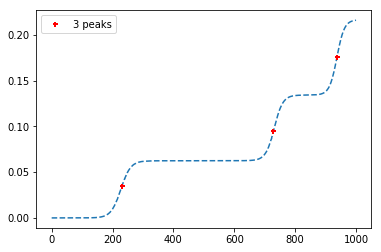

...

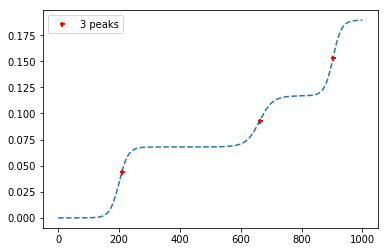

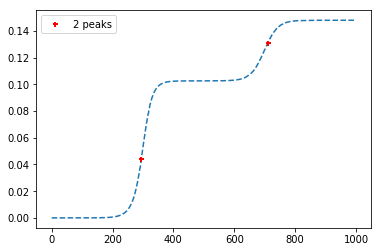

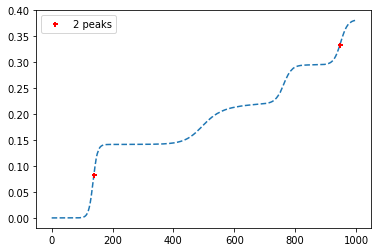

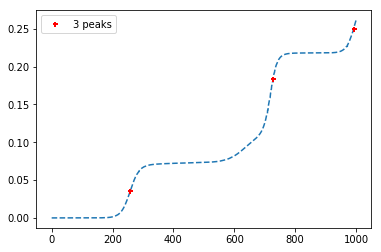

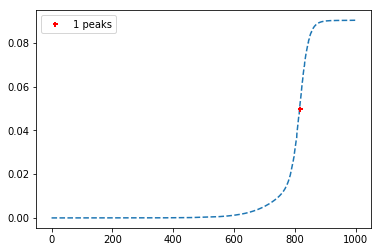

In [23]:
# loop over sims
sims = set(df['sim'].values)
t_lag = np.zeros(len(sims))
for i, sim in enumerate(sims):
    # extract data for this sim
    data = df[df['sim'] == sim]
    t = data['time'].values
    f = data['value'].values
    # smooth with gaussian filter
    gaussian_filter = gaussian(30, 10)
    filtered_signal = convolve1d(f, gaussian_filter/gaussian_filter.sum())
    # calculate first derivative  
    dt = np.diff(t)
    t_avg = (t[1:]+t[:-1])/2
    filt_grad = np.diff(filtered_signal)/dt
    # find peaks
    peak_ind = peakutils.indexes(filt_grad, thres=0.3, min_dist=int(50/dt.mean()))
    # get timestamp for this point
    t_lag[i] = t_avg[peak_ind[0]]
    pplot(t, f, peak_ind)
    plt.show()

In [24]:
t_r18 = t_lag

In [25]:
# import some data 
filename = 'res/manuscript_traces/3-6_Reductionist Code 19AA_favg_traces_T=1000_N=100_b=1_l=2.pickle'
with open(filename, 'rb') as handle:
    df = pickle.load(handle)

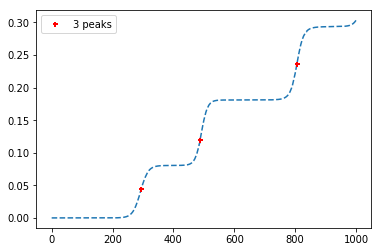

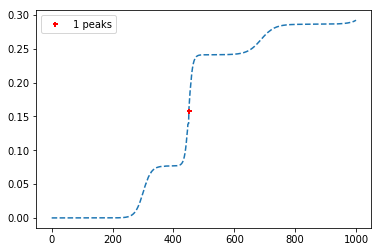

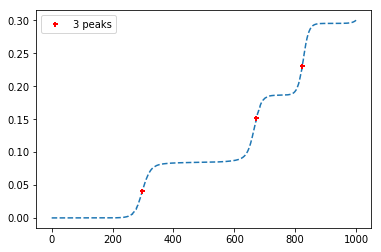

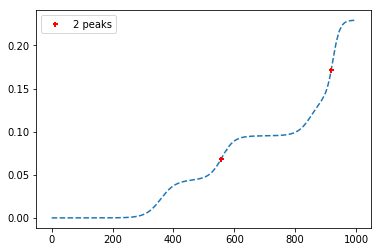

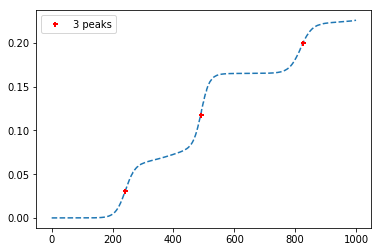

...

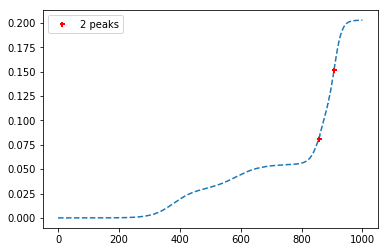

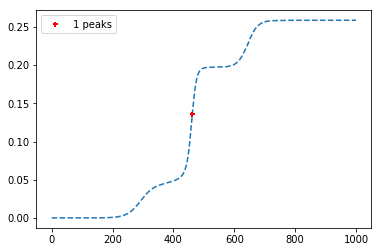

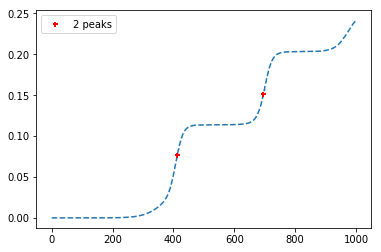

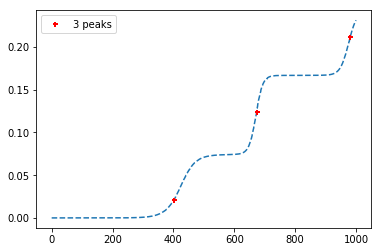

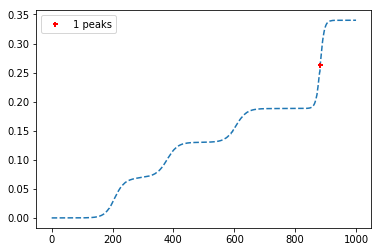

In [26]:
# loop over sims
sims = set(df['sim'].values)
t_lag = np.zeros(len(sims))
for i, sim in enumerate(sims):
    # extract data for this sim
    data = df[df['sim'] == sim]
    t = data['time'].values
    f = data['value'].values
    # smooth with gaussian filter
    gaussian_filter = gaussian(30, 10)
    filtered_signal = convolve1d(f, gaussian_filter/gaussian_filter.sum())
    # calculate first derivative  
    dt = np.diff(t)
    t_avg = (t[1:]+t[:-1])/2
    filt_grad = np.diff(filtered_signal)/dt
    # find peaks
    peak_ind = peakutils.indexes(filt_grad, thres=0.3, min_dist=int(50/dt.mean()))
    # get timestamp for this point
    t_lag[i] = t_avg[peak_ind[0]]
    pplot(t, f, peak_ind)
    plt.show()

In [27]:
t_r19 = t_lag

In [28]:
# import some data 
filename = 'res/manuscript_traces/3-6_Reductionist Code 20AA_favg_traces_T=1000_N=100_b=1_l=2.pickle'
with open(filename, 'rb') as handle:
    df = pickle.load(handle)

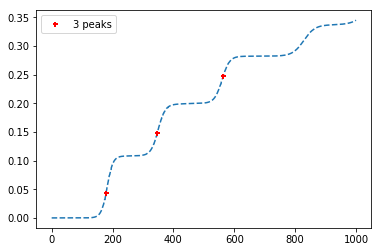

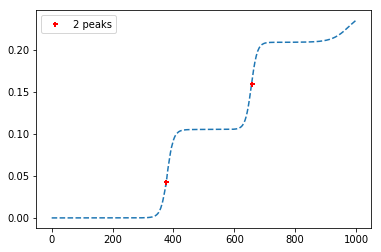

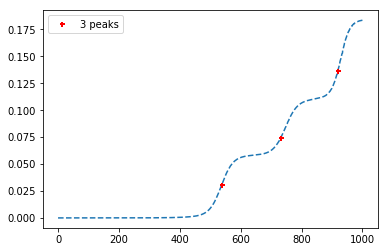

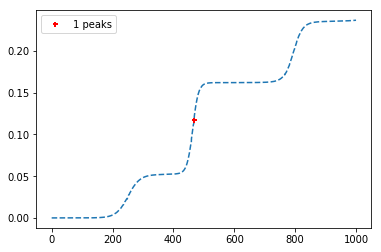

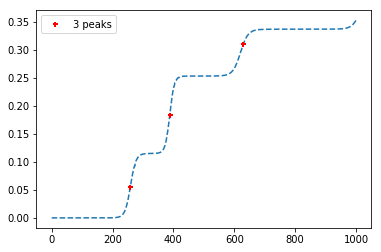

...

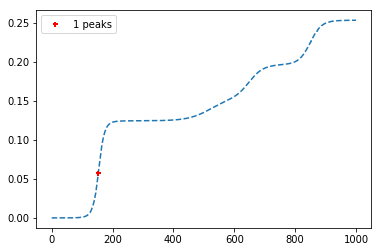

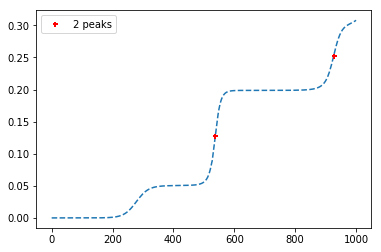

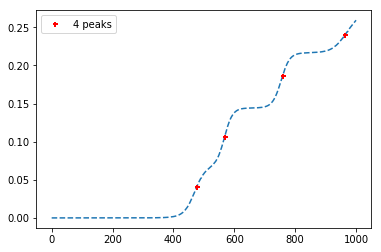

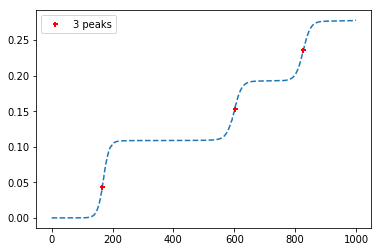

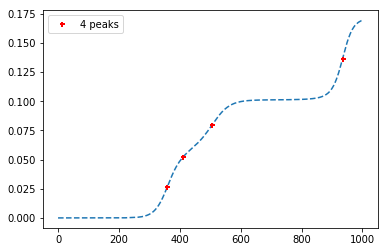

In [29]:
# loop over sims
sims = set(df['sim'].values)
t_lag = np.zeros(len(sims))
for i, sim in enumerate(sims):
    # extract data for this sim
    data = df[df['sim'] == sim]
    t = data['time'].values
    f = data['value'].values
    # smooth with gaussian filter
    gaussian_filter = gaussian(30, 10)
    filtered_signal = convolve1d(f, gaussian_filter/gaussian_filter.sum())
    # calculate first derivative  
    dt = np.diff(t)
    t_avg = (t[1:]+t[:-1])/2
    filt_grad = np.diff(filtered_signal)/dt
    # find peaks
    peak_ind = peakutils.indexes(filt_grad, thres=0.3, min_dist=int(50/dt.mean()))
    # get timestamp for this point
    t_lag[i] = t_avg[peak_ind[0]]
    pplot(t, f, peak_ind)
    plt.show()

In [30]:
t_r20 = t_lag

In [31]:
data = [t_r16, t_r17, t_r18, t_r19, t_r20]
codes = ['Red16', 'Red17', 'Red18','Red19','Red20']
dfs = []
for (series, code) in zip(data, codes):
    df = pd.DataFrame({
        't_lag' : series,
        'code' : [code for i in range(len(series))]
    })
    dfs.append(df)
all_data = pd.concat(dfs)

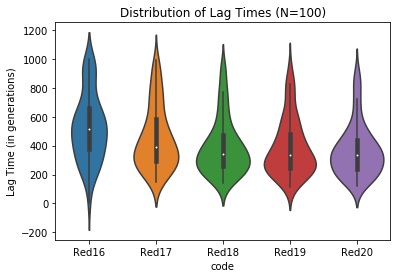

In [32]:
ax = sns.violinplot(x='code', y='t_lag', data=all_data)
plt.title('Distribution of Lag Times (N=100)')
plt.ylabel('Lag Time (in generations)')
plt.savefig('Red16-20.pdf')